# ELG7186 - Fall 2022 - Assignment 2
## Due: <strong>Wednesday November 2<sup>th</sup> 2022 -- 11:59pm</strong>

The purpose of this assignment is to gain experience building and training neural networks. You will learn:
- Design and train a fully-connected neural network
- Train an existing CNN architecture using fine-tuning
- Visualize the trained model


### Submission Details
Submit your Jupyter notebook .ipynb file using Brightspace. Do not include any other files or images as they will not be reviewed.
<p>
<strong>Make certain that you run all the cells in the notebook you submit</strong> or you will loose marks.
</p>
<ul>
<li>You can submit multiple times, but only the most recent submission will be saved</li>
<li>Do not wait until the last minute to submit in case you have an unexpected issue</li>
<li>Review the late policy in the syllabus</li>
<li><strong>You must submit your own work</strong> and abide by the University of Ottawa policy on plagiarism and fraud</li>
</ul>


### DO NOT submit any images from the dataset

## Part 0. Data Preparation

To complete the assignment you will download the Caltech Bird dataset and devise an appropriate training set split. <b>You are free to sample from the dataset to reduce the overal training samples depending on your access to compute.</b> Again, the overall accuracy is less important than your  observations and comparisons.

Dataset: <a href="http://www.vision.caltech.edu/visipedia/CUB-200-2011.html">Caltech-UCSD Birds-200-2011</a> (Also posed on Brightspace)

The dataset contains annotations for various tasks. In this assignment you will use the categories for classification (species labels)

In this section:
<ul>
<li>Download the dataset as described above</li>
<li>Create your splits for your dataset (there is a split provided for the full dataset) </li>
<li>Visualize five samples of each class by plotting a grid using the matplotlib library.</li>
</ul>


In [ ]:
!pip install split-folders

In [ ]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import splitfolders
import PIL

C:\Users\user\anaconda3\envs\pythonProject3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [ ]:
splitfolders.ratio("CUB_200_2011/images",
                   output="CUB_200_2011/cv/data2/",
                   seed=42,
                   ratio=(0.7,0.3),
                   group_prefix=None,
                   move=False
                   )

In [ ]:
train_path="CUB_200_2011/cv/data2/train"
test_path="CUB_200_2011/cv/data2/val"

In [ ]:
train_gen = ImageDataGenerator(rescale=1/255,zoom_range=[0.5,1.0])
val_gen = ImageDataGenerator(rescale=1/255,zoom_range=[0.5,1.0])

In [ ]:
training_set = train_gen.flow_from_directory(train_path,
                                                 target_size = (32, 32),
                                                 batch_size = 8232,
                                                 class_mode = 'sparse')


test_set = val_gen.flow_from_directory(test_path,
                                            target_size = (32, 32),
                                            batch_size = 3556,
                                            class_mode = 'sparse')


Found 8232 images belonging to 200 classes.
Found 3556 images belonging to 200 classes.


In [ ]:
for data_batch, labels_batch in training_set:
    print('data set shape:', data_batch.shape)
    print('labels set shape:', labels_batch.shape)
    break

data set shape: (8232, 32, 32, 3)
labels set shape: (8232,)


In [ ]:
type(training_set)

keras.preprocessing.image.DirectoryIterator

In [ ]:
training_set.labels.shape

(8232,)

In [ ]:
train_y=training_set.labels
test_y=test_set.labels

In [ ]:
training_set.classes

array([  0,   0,   0, ..., 199, 199, 199])

In [ ]:
train_x=[]
training_set.reset()
for i in range(training_set.__len__()):
   a,b=training_set.next()
   train_x.append(a)
train_x=np.array(train_x)
print(train_x.shape)


(1, 8232, 32, 32, 3)


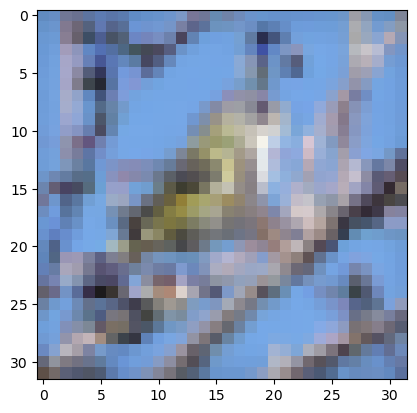

In [ ]:
plt.imshow(train_x[0][7])

In [ ]:
train_y

array([  0,   0,   0, ..., 199, 199, 199])

In [ ]:
test_x=[]
test_set.reset()
for i in range(test_set.__len__()):
   a,b=test_set.next()
   test_x.append(a)
test_x=np.array(test_x)
print(test_x.shape)


(1, 3556, 32, 32, 3)


In [ ]:
 idxs = np.nonzero([i == 5 for i in training_set.labels])
 idxs[0]

array([196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208,
       209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221,
       222, 223], dtype=int64)

In [ ]:
import random

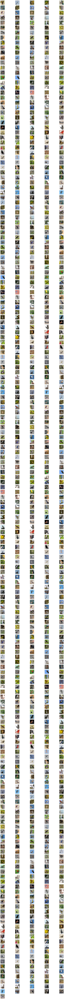

In [ ]:

samples = 5
plt.figure(1, figsize=(15, 200))
for y in range(0,200):
    idxs = np.nonzero([i == y for i in training_set.labels])
    idxs = np.random.choice(idxs[0], 5, replace=False)
    for i in range(0,5):
        plt.subplot(200,5,i*199+y+1)
        plt.xticks(position=(0, 0.1), size=10)
        plt.imshow(train_x[0][y])
        plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
train_x.shape[1]

8232

In [ ]:
train_x=train_x.reshape((-1,3072))

In [ ]:
test_x=test_x.reshape((-1,3072))

In [ ]:
train_x.shape

(8232, 3072)

In [ ]:
train_y.shape

(8232,)

In [ ]:
test_x.shape

(3556, 3072)

In [ ]:
test_y.shape

(3556,)

## Part 1. Perceptron (3 Marks)
For this section you will implement a fully connected neural network (multi-layer perceptron). To do this you will need to perform the following steps:
- Resize the images to be no larger than 32x32.
- Use the sequential model API in keras to build your network using dense layers (consider performance impacts of fully connected layers)
- You must decide an appropriate number of neurons and layers.
- Print a summary of your model configuration. 


When your classifier is working:
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data
- Provide a brief discussion of your results 


In [ ]:
from tensorflow.keras import models
from tensorflow.keras import layers
from keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import plot_model

In [ ]:
mlp_model = models.Sequential()
mlp_model.add(layers.Dense(1024, activation='relu', input_shape=(3072,)))
mlp_model.add(Dropout(0.5))
mlp_model.add(layers.Dense(512, activation='relu'))
mlp_model.add(Dropout(0.5))
mlp_model.add(Dense(1024, activation='relu'))
mlp_model.add(Dropout(0.5))
mlp_model.add(Dense(200, activation='softmax'))

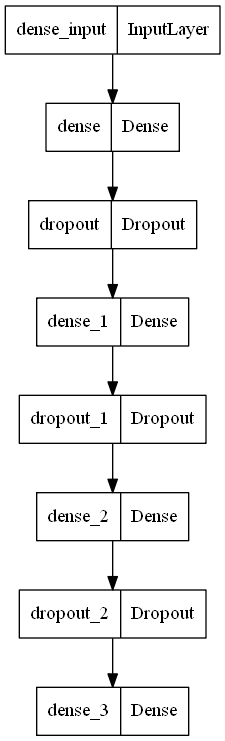

In [ ]:
plot_model(mlp_model)

In [ ]:
# Compile
mlp_model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])


In [ ]:
# Fit
history = mlp_model.fit(train_x,train_y,epochs=100,validation_data=(test_x,test_y))

Epoch 1/100
258/258 [==============================] - 5s 17ms/step - loss: 5.2975 - accuracy: 0.0036 - val_loss: 5.2974 - val_accuracy: 0.0051
Epoch 2/100
258/258 [==============================] - 5s 19ms/step - loss: 5.2981 - accuracy: 0.0034 - val_loss: 5.2974 - val_accuracy: 0.0051
Epoch 3/100
258/258 [==============================] - 5s 21ms/step - loss: 5.2981 - accuracy: 0.0040 - val_loss: 5.2974 - val_accuracy: 0.0051
Epoch 4/100
258/258 [==============================] - 5s 20ms/step - loss: 5.2981 - accuracy: 0.0045 - val_loss: 5.2974 - val_accuracy: 0.0051
Epoch 5/100
258/258 [==============================] - 5s 19ms/step - loss: 5.2973 - accuracy: 0.0050 - val_loss: 5.2974 - val_accuracy: 0.0051
Epoch 6/100
258/258 [==============================] - 5s 20ms/step - loss: 5.2981 - accuracy: 0.0026 - val_loss: 5.2974 - val_accuracy: 0.0051
Epoch 7/100
258/258 [==============================] - 5s 20ms/step - loss: 5.2980 - accuracy: 0.0040 - val_loss: 5.2974 - val_accuracy:

In [ ]:
mlp_pred = mlp_model.predict(test_x)
mlp_pred = np.argmax(mlp_pred , axis = 1)
mlp_pred = mlp_pred.reshape((-1,1))

112/112 [==============================] - 1s 5ms/step


In [ ]:
#evalute model preformance
score = mlp_model.evaluate(test_x, test_y, verbose=1)
print('Loss: %.2f' % ( score[0]))
print('Accuracy: %.2f' % ( score[1]*100))

112/112 [==============================] - 1s 6ms/step - loss: 5.2974 - accuracy: 0.0051
Loss: 5.30
Accuracy: 0.51


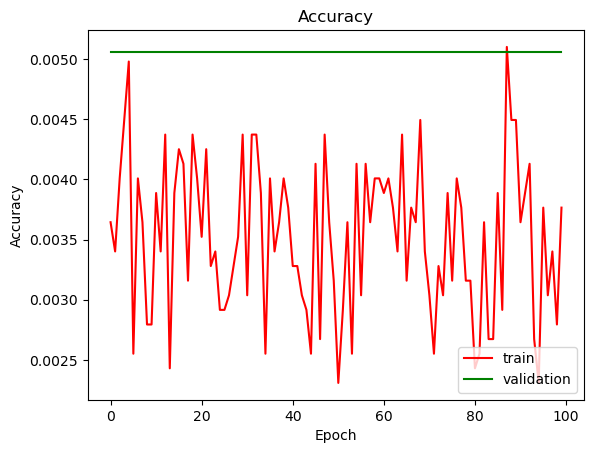

In [ ]:
plt.plot(history.history['accuracy'],c='red')
plt.plot(history.history['val_accuracy'],c='green')
plt.title('Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train','validation'],loc='lower right')

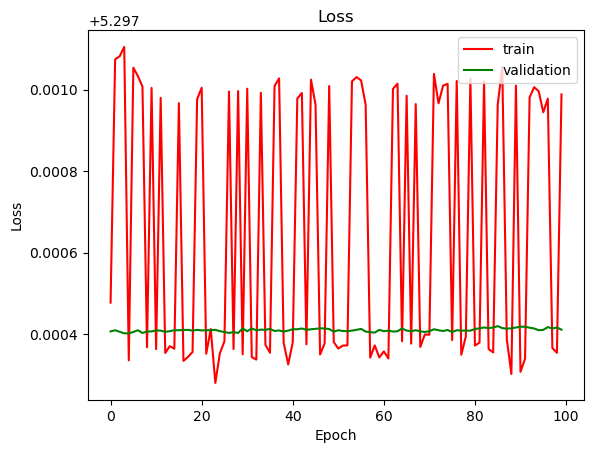

In [ ]:
plt.plot(history.history['loss'],c='red')
plt.plot(history.history['val_loss'],c='green')
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train','validation'],loc='upper right')

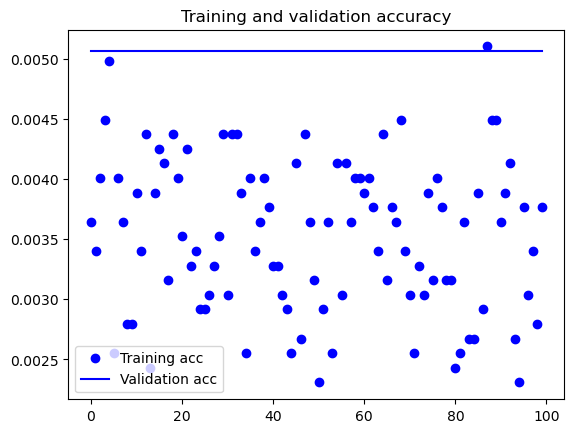

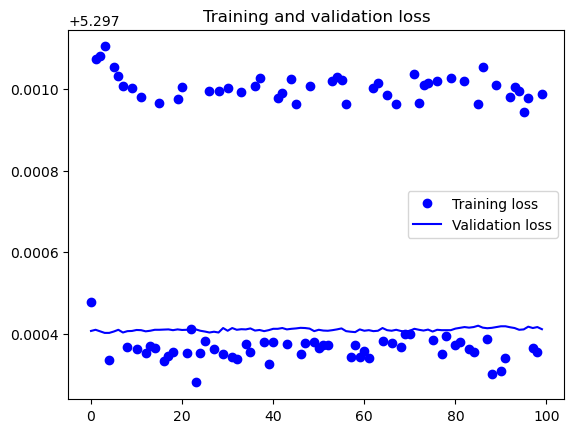

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

**By using Multi layer perceptron to classify the data with epochs=100, we have got Loss: 5.30 Accuracy: 0.51 for testing data and Loss: 5.2980 - Accuracy: 0.0038 for training data  which is  indicates to underfitting  in the model,the MLP can not  learn from the data as the size of images is  32 *32 ***

## Part 2. ResNet-101 (4 Marks)

For this section you will adapt the ResNet-101 network for the current task using tranfer learning and fine-tuning. You will implement the following in your process:
- You should choose a suitable image size.
- Choose a suitable labelling scheme.
- Use the pretrained ResNet-101 network available in Keras.
- Remove the top fully connected layers. Include your own FC layers that match our dataset.
- Choose some layers to "freeze" and the remaining layers you will fine-tune with the new dataset.

### Step 1
You will use the above steps to train a ResNet-101 model using the Bird dataset
- Use transfer learning to train your first model by removing the FC layers, but leaving the other layers intact.
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data

### Step 2
Now use the same steps as above, but this time unfreeze some convolutional layers and retrain the network. Again, plot your results.

### Step 3
Discuss the results of both methods from step 1 and step 2 while using plots and graphics to support your discussion.


In [ ]:
!pip install split-folders

In [ ]:
!pip install tensorflow

In [ ]:
!pip install pydot

In [ ]:
!pip install scipy

In [ ]:
import scipy

In [ ]:
from tensorflow.keras import Model
import splitfolders
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from keras.applications import ResNet101
from keras_preprocessing.image import img_to_array
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
import numpy as np
import scipy
import os
import cv2
import matplotlib.pyplot as plt
import PIL

### Step 1 Solution


In [ ]:
splitfolders.ratio('CUB_200_2011/images',
                   output="CUB_200_2011/cv/resent101/",
                   seed=42,
                   ratio=(0.7,0.3),
                   group_prefix=None,
                   move=False
                   )

In [ ]:
Train_dir='CUB_200_2011/cv/resent101/train'
Test_dir='CUB_200_2011/cv/resent101/val'


In [ ]:
Train_generator=ImageDataGenerator(rescale=1/255)

Test_generator=ImageDataGenerator(rescale=1/255)

In [ ]:
train_generator=Train_generator.flow_from_directory(Train_dir,
                                                 target_size=(32,32),
                                                 color_mode='rgb',
                                                 class_mode='sparse')



test_generator=Test_generator.flow_from_directory(Test_dir,
                                                 target_size=(32,32),
                                                 color_mode='rgb',
                                                 class_mode='sparse')

Found 8232 images belonging to 200 classes.
Found 4695 images belonging to 200 classes.


In [ ]:
test_generator

In [ ]:
test_x=[]
test_generator.reset()
for i in range(test_generator.__len__()):
   a,b=test_generator.next()
   test_x.append(a)
test_x=np.array(test_x)
print(test_x.shape)


(147,)


C:\Users\user\AppData\Local\Temp\ipykernel_6040\4072776620.py:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  test_x=np.array(test_x)


In [ ]:
train_generator.class_indices

In [ ]:
baseline_resent101=ResNet101(input_shape=(32,32,3),weights='imagenet',include_top=False)
for layer in baseline_resent101.layers:
    layer.trainable=False

In [ ]:
baseline_resent101.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 38, 38, 3)    0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 16, 16, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1_conv[0][0]']             
                                                                                          

In [ ]:
freeze_model=Sequential()
freeze_model.add(baseline_resent101)
freeze_model.add(Dropout(0.5))

freeze_model.add(Flatten())

freeze_model.add(Dense(1024,activation="relu"))
freeze_model.add(Dropout(0.5))

freeze_model.add(Dense(1024,activation="relu"))
freeze_model.add(Dropout(0.5))

freeze_model.add(Dense(200,activation='softmax'))
print(freeze_model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 1, 1, 2048)        42658176  
                                                                 
 dropout_3 (Dropout)         (None, 1, 1, 2048)        0         
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 1024)              2098176   
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 1024)              1049600   
                                                                 
 dropout_5 (Dropout)         (None, 1024)             

In [ ]:
freeze_model.compile(loss='sparse_categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [ ]:
freeze_model_history=freeze_model.fit(train_generator,validation_data=test_generator,epochs=100)

Epoch 1/100
258/258 [==============================] - 86s 332ms/step - loss: 5.3895 - accuracy: 0.0051 - val_loss: 5.3004 - val_accuracy: 0.0051
Epoch 2/100
258/258 [==============================] - 57s 222ms/step - loss: 5.3230 - accuracy: 0.0041 - val_loss: 5.3029 - val_accuracy: 0.0051
Epoch 3/100
258/258 [==============================] - 57s 221ms/step - loss: 5.3138 - accuracy: 0.0057 - val_loss: 5.3001 - val_accuracy: 0.0049
Epoch 4/100
258/258 [==============================] - 54s 211ms/step - loss: 5.3095 - accuracy: 0.0030 - val_loss: 5.2994 - val_accuracy: 0.0043
Epoch 5/100
258/258 [==============================] - 53s 204ms/step - loss: 5.3097 - accuracy: 0.0036 - val_loss: 5.2982 - val_accuracy: 0.0049
Epoch 6/100
258/258 [==============================] - 52s 202ms/step - loss: 5.3085 - accuracy: 0.0039 - val_loss: 5.2979 - val_accuracy: 0.0049
Epoch 7/100
258/258 [==============================] - 54s 209ms/step - loss: 5.3071 - accuracy: 0.0052 - val_loss: 5.2988 -

In [ ]:
score=freeze_model.evaluate(test_generator)
print('Loss: %.2f' % ( score[0]))
print('Accuracy: %.2f' % ( score[1]*100))

147/147 [==============================] - 22s 148ms/step - loss: 5.2970 - accuracy: 0.0051
Loss: 5.30
Accuracy: 0.51



-  Accuracy curve  plot for training and test data



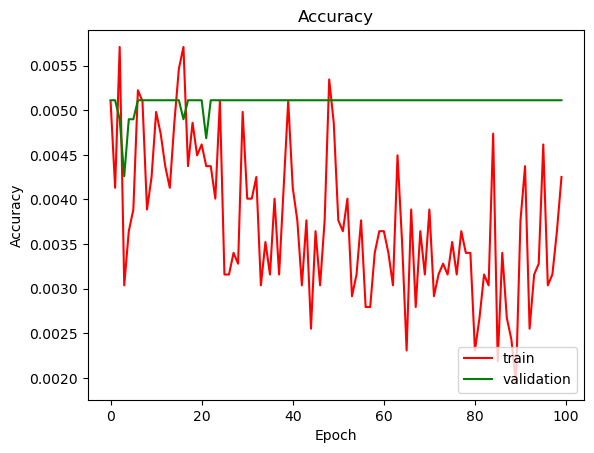

In [ ]:
plt.plot(freeze_model_history.history['accuracy'],c='red')
plt.plot(freeze_model_history.history['val_accuracy'],c='green')
plt.title('Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train','validation'],loc='lower right')

-  Loss curve  plot for training and test data

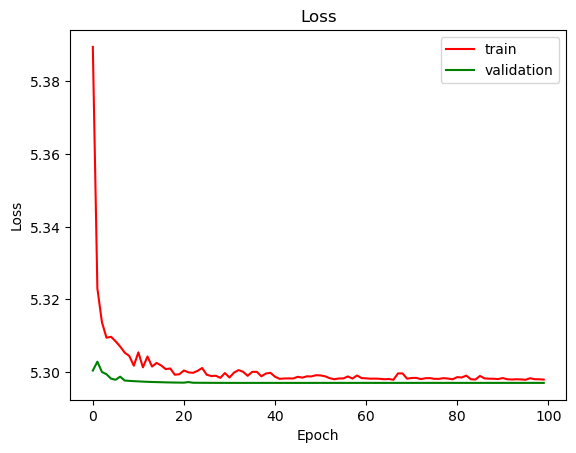

In [ ]:
plt.plot(freeze_model_history.history['loss'],c='red')
plt.plot(freeze_model_history.history['val_loss'],c='green')
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train','validation'],loc='upper right')

### Step 2 Solution

In [ ]:
resent_unfreeze=ResNet101(input_shape=(32,32,3),weights='imagenet',include_top=False)
resent_unfreeze.trainable = True


for layer in resent_unfreeze.layers[-20:]:
    layer.trainable = True

In [ ]:
resent_unfreeze.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 38, 38, 3)    0           ['input_3[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 16, 16, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1_conv[0][0]']             
                                                                                          

In [ ]:
unfreeze_model=Sequential()
unfreeze_model.add(resent_unfreeze)
unfreeze_model.add(Dropout(0.5))

unfreeze_model.add(Flatten())

unfreeze_model.add(Dense(1024,activation="relu"))
unfreeze_model.add(Dropout(0.5))

unfreeze_model.add(Dense(1024,activation="relu"))
unfreeze_model.add(Dropout(0.5))

unfreeze_model.add(Dense(200,activation='softmax'))
print(unfreeze_model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 1, 1, 2048)        42658176  
                                                                 
 dropout_6 (Dropout)         (None, 1, 1, 2048)        0         
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_7 (Dense)             (None, 1024)              2098176   
                                                                 
 dropout_7 (Dropout)         (None, 1024)              0         
                                                                 
 dense_8 (Dense)             (None, 1024)              1049600   
                                                                 
 dropout_8 (Dropout)         (None, 1024)             

In [ ]:
unfreeze_model.compile(loss='sparse_categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [ ]:
unfreeze_model_history=unfreeze_model.fit(train_generator,batch_size=2000,validation_data=test_generator,epochs=20)

Epoch 1/20
258/258 [==============================] - 271s 1s/step - loss: 5.1941 - accuracy: 0.0085 - val_loss: 5.1617 - val_accuracy: 0.0104
Epoch 2/20
258/258 [==============================] - 257s 996ms/step - loss: 5.2067 - accuracy: 0.0083 - val_loss: 5.1651 - val_accuracy: 0.0106
Epoch 3/20
258/258 [==============================] - 258s 999ms/step - loss: 5.2069 - accuracy: 0.0077 - val_loss: 5.1980 - val_accuracy: 0.0094
Epoch 4/20
258/258 [==============================] - 253s 979ms/step - loss: 5.1964 - accuracy: 0.0097 - val_loss: 5.2380 - val_accuracy: 0.0072
Epoch 5/20
258/258 [==============================] - 253s 980ms/step - loss: 5.3134 - accuracy: 0.0043 - val_loss: 5.3256 - val_accuracy: 0.0062
Epoch 6/20
258/258 [==============================] - 254s 983ms/step - loss: 5.3169 - accuracy: 0.0056 - val_loss: 5.2994 - val_accuracy: 0.0053
Epoch 7/20
258/258 [==============================] - 253s 982ms/step - loss: 5.2863 - accuracy: 0.0064 - val_loss: 5.2597 - va

In [ ]:
score=unfreeze_model.evaluate(test_generator)
print('Loss: %.2f' % ( score[0]))
print('Accuracy: %.2f' % ( score[1]*100))

147/147 [==============================] - 25s 170ms/step - loss: 5.2337 - accuracy: 0.0079
Loss: 5.23
Accuracy: 0.79


-  Accuracy curve  plot for training and test data

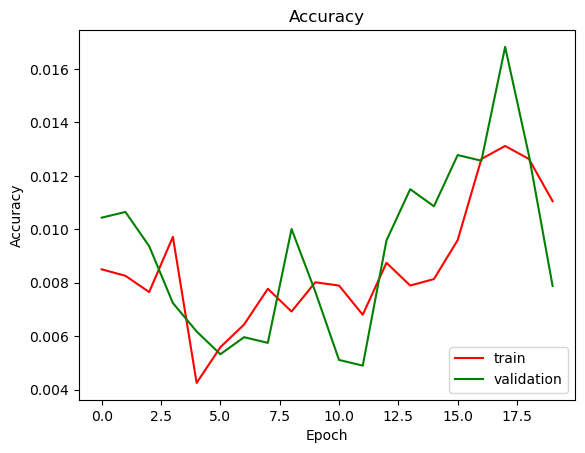

In [ ]:
plt.plot(unfreeze_model_history.history['accuracy'],c='red')
plt.plot(unfreeze_model_history.history['val_accuracy'],c='green')
plt.title('Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['train','validation'],loc='lower right')

-  Loss curve  plot for training and test data

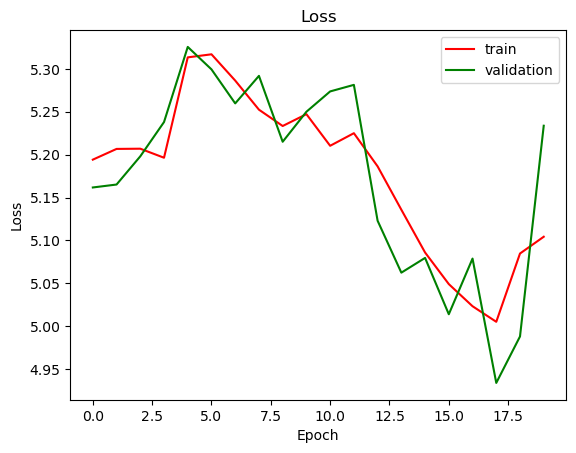

In [ ]:
plt.plot(unfreeze_model_history.history['loss'],c='red')
plt.plot(unfreeze_model_history.history['val_loss'],c='green')
plt.title('Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train','validation'],loc='upper right')

discussion here.

**At the first step, we used RESENT101 pretrained  model also freezing all parameters of the sequential model we have built with 3 layers with 1024 neurons and the last layer with the number of classes and dropout weights with 0.5. The accuracy and loss od testing data of freeze model are 5.30,0.51 respectively , the accuracy and loss of training data are  5.2984 ,0.3 respectively which indicates to underfitting in training and testing data. the freeze model cause underfitting.
At the second step ,we also used RESENT101 pretrained model but we unfreezed some layers ,we unfreezed the last 20 layer in the model, teating accurcy slightly increesed to 0.79 and the Loss decreased to  5.23***

**by comparing the freezing and unfreezing layers in each  model , we can said that the unfreezing model is better than the freeze as it let the sequential model to train on some layers and can improve the training and testing accuracy** 

## Part 3. Visualization (3 Marks)

For this section you will visualize the filters learned byyour ResNet-101 network and use t-SNE to observe clusters that were learned by your model.
- Make sure to provide the graphic results for your visualizations
- Provide an interpretation of the results



In [ ]:
filter_model = Model(inputs=resent_unfreeze.inputs, outputs=resent_unfreeze.layers[5].output)
filter_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv1_pad (ZeroPadding2D)   (None, 38, 38, 3)         0         
                                                                 
 conv1_conv (Conv2D)         (None, 16, 16, 64)        9472      
                                                                 
 conv1_bn (BatchNormalizatio  (None, 16, 16, 64)       256       
 n)                                                              
                                                                 
 conv1_relu (Activation)     (None, 16, 16, 64)        0         
                                                                 
 pool1_pad (ZeroPadding2D)   (None, 18, 18, 64)        0         
                                                             

In [ ]:
filters, bias = resent_unfreeze.layers[2].get_weights()

In [ ]:
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

In [ ]:
import matplotlib.pyplot as plt

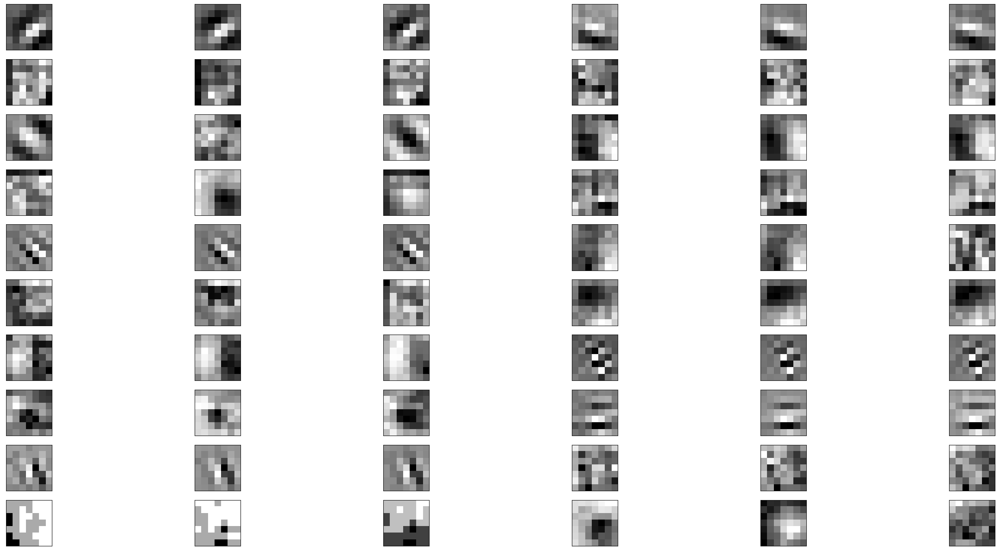

In [ ]:
plt.figure(figsize=(35, 35))
n_filters, ix = 20, 1
for i in range(n_filters):
    f = filters[:, :, :, i]
    for j in range(3):
        ax = plt.subplot(n_filters, 6, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(f[:, :, j], cmap='gray')
        ix += 1
 # show the figure
plt.show()

In [ ]:
!pip install seaborn

Discuss here.

*** At this Visualization part, we plot the filters of conv layer number 5**

In [ ]:
unfreeze_model_pred = unfreeze_model.predict(test_generator,batch_size=4)
unfreeze_model_pred


147/147 [==============================] - 22s 145ms/step


array([[0.00712716, 0.00660073, 0.0071173 , ..., 0.00740353, 0.0064498 ,
        0.00123422],
       [0.00331337, 0.00474368, 0.0038718 , ..., 0.00560219, 0.00496689,
        0.00199166],
       [0.00749409, 0.00678487, 0.00744532, ..., 0.00753826, 0.00646251,
        0.00113113],
       ...,
       [0.00317078, 0.00468563, 0.00374308, ..., 0.00578815, 0.00497205,
        0.00213656],
       [0.00840989, 0.00709491, 0.00834632, ..., 0.00777068, 0.00655953,
        0.00090966],
       [0.00785407, 0.00692766, 0.00780154, ..., 0.0076703 , 0.00651626,
        0.00102794]], dtype=float32)

In [ ]:
predictions_df = pd.DataFrame(unfreeze_model_pred)

In [ ]:
labels_model= np.argmax(unfreeze_model_pred,axis=1)

In [ ]:
np.unique(labels_model)

array([  3,  20,  32,  54,  56,  71,  85,  93,  98, 105, 127, 158, 159,
       161, 171, 180, 183, 186, 189, 191, 199], dtype=int64)

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne = tsne.fit_transform(unfreeze_model_pred)

tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

df_subset=pd.DataFrame(tsne[:,0],columns=['tsne-2d-one'])
df_subset=pd.DataFrame(tsne[:,1],columns=['tsne-2d-two'])

C:\Users\user\anaconda3\envs\pythonProject3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\user\anaconda3\envs\pythonProject3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 4695 samples in 0.000s...
[t-SNE] Computed neighbors for 4695 samples in 0.599s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4695
[t-SNE] Computed conditional probabilities for sample 2000 / 4695
[t-SNE] Computed conditional probabilities for sample 3000 / 4695
[t-SNE] Computed conditional probabilities for sample 4000 / 4695
[t-SNE] Computed conditional probabilities for sample 4695 / 4695
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.749184
[t-SNE] KL divergence after 300 iterations: 1.184875


In [ ]:
df_subset['tsne-2d-one'] = tsne[:,0]
df_subset['tsne-2d-two'] = tsne[:,1]

In [ ]:
predictions_df

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,0.000367,0.002444,0.000924,0.005923,0.001962,0.000861,0.002374,0.000686,0.002529,0.004622,...,0.003938,0.003396,0.004887,0.004123,0.006885,0.006607,0.005965,0.004847,0.007024,0.009956
1,0.003313,0.004744,0.003872,0.007512,0.004092,0.003256,0.005180,0.003245,0.005784,0.006051,...,0.005876,0.007424,0.006395,0.006265,0.005364,0.005432,0.005555,0.005602,0.004967,0.001992
2,0.003313,0.004744,0.003872,0.007512,0.004092,0.003256,0.005180,0.003245,0.005784,0.006051,...,0.005876,0.007424,0.006395,0.006265,0.005364,0.005432,0.005555,0.005602,0.004967,0.001992
3,0.003207,0.004697,0.003742,0.007335,0.004120,0.003226,0.005056,0.003278,0.005527,0.006074,...,0.005737,0.007060,0.006662,0.006227,0.005492,0.005303,0.005596,0.005945,0.005050,0.002222
4,0.003161,0.004681,0.003733,0.007457,0.004070,0.003195,0.005064,0.003190,0.005578,0.006050,...,0.005808,0.007171,0.006584,0.006260,0.005461,0.005390,0.005594,0.005798,0.004979,0.002150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4690,0.003313,0.004744,0.003872,0.007512,0.004092,0.003256,0.005180,0.003245,0.005784,0.006051,...,0.005876,0.007424,0.006395,0.006265,0.005364,0.005432,0.005555,0.005602,0.004967,0.001992
4691,0.006613,0.006352,0.006675,0.004934,0.005206,0.005292,0.006393,0.006140,0.007108,0.006564,...,0.005477,0.006856,0.006449,0.005972,0.004881,0.003565,0.005102,0.007263,0.006292,0.001285
4692,0.003313,0.004744,0.003872,0.007512,0.004092,0.003256,0.005180,0.003245,0.005784,0.006051,...,0.005876,0.007424,0.006395,0.006265,0.005364,0.005432,0.005555,0.005602,0.004967,0.001992
4693,0.007757,0.006906,0.007725,0.004182,0.005350,0.005970,0.006776,0.007085,0.007472,0.006540,...,0.005496,0.006373,0.006548,0.005850,0.004496,0.002951,0.004885,0.007619,0.006475,0.001038


C:\Users\user\AppData\Local\Temp\ipykernel_6040\3831973879.py:2: UserWarning: The palette list has more values (200) than needed (21), which may not be intended.
  sns.scatterplot(


<AxesSubplot:xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

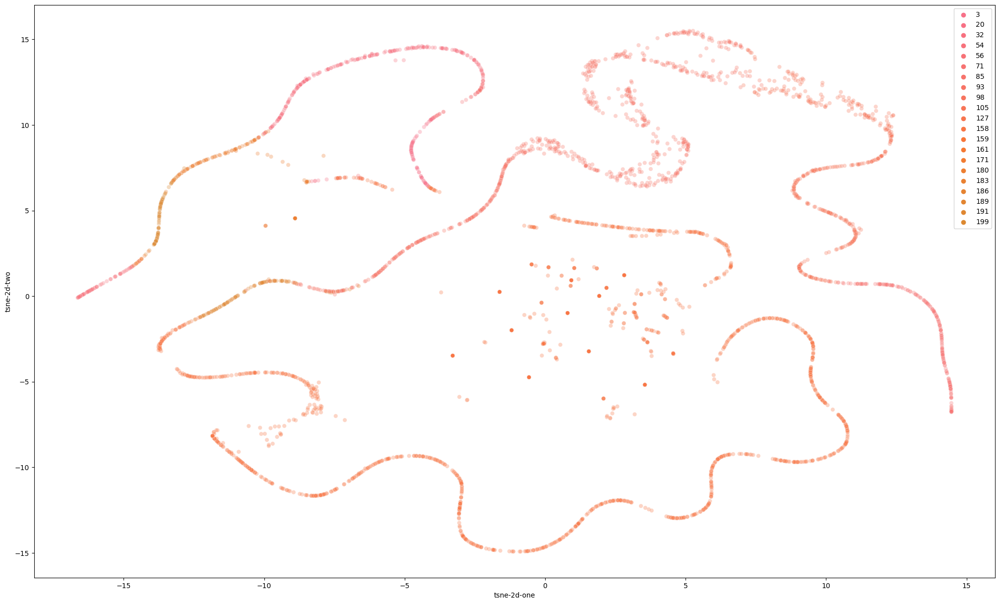

In [ ]:
plt.figure(figsize=(25,15))
sns.scatterplot(
    x=df_subset['tsne-2d-one'], y=df_subset['tsne-2d-two'],
    hue=labels_model,
    palette=sns.color_palette("husl", n_colors=200),
    data=predictions_df,
    legend="full",
    alpha=0.3
)

**IN this aprt we plot the TSNE graph of the predictions of the unfreeze model, the model has predicted only 21 class, we plot this predications in tsne graph**

## Bonus (1 Mark)
Visualize the activation maps produced by your network and discuss the results using an image from the test and another image of your choice.


In [ ]:
!pip install keract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# example of calculation 2d convolutions
from numpy import asarray
from keras.models import Sequential
from keras.layers import Conv2D
from tensorflow.keras.layers import Dense
# define input data
data = [[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0],
		[0, 0, 0, 1, 1, 0, 0, 0]]
data = asarray(data)
data = data.reshape(1, 8, 8, 1)
# create model
model = Sequential()
model.add(Conv2D(64, (3,3), input_shape=(48, 48, 1)))
model.add(Conv2D(128, (5,5) ))
model.add(Dense(256))

# # define a vertical line detector
# detector = [[[[0]],[[1]],[[0]]],
#             [[[0]],[[1]],[[0]]],
#             [[[0]],[[1]],[[0]]]]
# weights = [asarray(detector), asarray([0.0])]
# # store the weights in the model
# model.set_weights(weights)
# # confirm they were stored
# print(model.get_weights())
# # apply filter to input data
# yhat = model.predict(data)
# for r in range(yhat.shape[1]):
# 	# print each column in the row
# 	print([yhat[0,r,c,0] for c in range(yhat.shape[2])])

In [ ]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 46, 46, 64)        640       
                                                                 
 conv2d_11 (Conv2D)          (None, 42, 42, 128)       204928    
                                                                 
 dense_1 (Dense)             (None, 42, 42, 256)       33024     
                                                                 
Total params: 238,592
Trainable params: 238,592
Non-trainable params: 0
_________________________________________________________________
